In [1]:
from pymongo import ASCENDING, GEOSPHERE, MongoClient
import pandas as pd
from alive_progress import alive_bar
from shapely.geometry import Point, mapping
from keplergl import KeplerGl
import shapely
import json
from os import listdir
from os.path import isfile, join
from tqdm import tqdm
import geopandas as gpd
from h3 import h3
import math
import sklearn
import numpy as np
import time

In [2]:
client = MongoClient('mongodb://localhost:27017/')
db = client.osmDataDB
coll_results = db.experimentsResults
coll_results_rf = db.experimentsResultsBalancedRF

In [3]:
# 58 59 46 47 3 2 10
# Barcelona, Berlin, Budapest, Poznań, Prague, Warsaw, Wrocław
results = [r for r in coll_results.find({'city': { '$in': ['Barcelona', 'Berlin', 'Budapest', 'Poznań', 'Prague', 'Warszawa', 'Wrocław']}})]
results_rf = [r for r in coll_results.find({'city': { '$in': ['Barcelona', 'Berlin', 'Budapest', 'Poznań', 'Prague', 'Warszawa', 'Wrocław']}})]

In [4]:
len(results)

6680

In [5]:
# neighbour_embedding_cls_dict = {
#     'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared Neighbour Embedding',
#     'ConcatenateNeighbourEmbedding': 'Concatenate Neighbour Embedding',
#     'AverageDiminishingNeighbourEmbedding': 'Average Diminishing Neighbour Embedding',
#     'AverageNeighbourEmbedding': 'Average Neighbour Embedding',
# }
processing_dict = {
    'None': 'None',
    'MinMaxScaler': 'Normalisation',
    'StandardScaler': 'Standardisation'
}
# processing_dict = {
#     'None': 0,
#     'MinMaxScaler': 1,
#     'StandardScaler': 2
# }
# processing_dict_rev = {
#     0: 'None',
#     1: 'Normalization',
#     2: 'Standardization'
# }
neighbour_embedding_cls_dict = {
    'AverageDiminishingSquqredNeighbourEmbedding': 'Average Diminishing Squared',
    'ConcatenateNeighbourEmbedding': 'Concatenate',
    # 'AverageDiminishingNeighbourEmbedding': 'Average Diminishing',
    # 'AverageNeighbourEmbedding': 'Average',
}
embedding_cls_dict = {
    'BaseCountCategoryEmbedding': 'Count Category',
    # 'BaseShapeAnalyzerEmbedding': 'Shape Analyzer',
    # 'PerCategoryShapeAnalyzerEmbedding300': 'All Tags\nShape Analyzer [300]',
    # 'PerCategoryFilteredShapeAnalyzerEmbedding300': 'Selected Tags\nShape Analyzer [300]'
}
metric_dict = {
    'accuracy': 'Accuracy',
    'f1_score': 'F1 Score',
    'custom_metric': 'Custom metric',
}
parsed_results = []
flat_parsed_results = []
for r in results:
    for it in r['results']:
        if (r['neighbours'] == 0 or r['neighbour_embedding_cls'] == 'AverageDiminishingSquqredNeighbourEmbedding') and \
            r['embedding_cls'] in embedding_cls_dict and \
            r['x_processing'] in processing_dict:
            parsed_results.append({
                'city': r['city'],
                'resolution': r['resolution'],
                'inbalance_ratio': r['inbalance_ratio'],
                'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                'neighbours': r['neighbours'],
                'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                'processing': processing_dict[r['x_processing']],
                'classfier_cls': it['classfier_cls'],
                'iteration': it['iteration'],
                'dataset_type': it['dataset_type'],
                'Accuracy': it['accuracy'],
                'F1 Score': it['f1_score'],
                'Custom metric': it['custom_metric']
            })
            for metric in ['accuracy', 'custom_metric', 'f1_score']:
                flat_parsed_results.append({
                    'city': r['city'],
                    'resolution': r['resolution'],
                    'inbalance_ratio': r['inbalance_ratio'],
                    'embedding_cls': embedding_cls_dict[r['embedding_cls']],
                    'neighbours': r['neighbours'],
                    'neighbour_embedding_cls': neighbour_embedding_cls_dict[r['neighbour_embedding_cls']],
                    'processing': processing_dict[r['x_processing']],
                    'classfier_cls': it['classfier_cls'],
                    'iteration': it['iteration'],
                    'dataset_type': it['dataset_type'],
                    'metric': metric_dict[metric],
                    'value': it[metric],
                })

In [6]:
df = pd.DataFrame(parsed_results)

In [12]:
df_flat = pd.DataFrame(flat_parsed_results)
df_flat = df_flat.sort_values(by=['processing', 'metric'])

In [13]:
df_flat

,city,resolution,inbalance_ratio,embedding_cls,neighbours,neighbour_embedding_cls,processing,classfier_cls,iteration,dataset_type,metric,value
240,Barcelona,9,1.0,Count Category,0,Concatenate,None,RandomForestClassifier,1,test,Accuracy,0.782209
243,Barcelona,9,1.0,Count Category,0,Concatenate,None,RandomForestClassifier,1,validation,Accuracy,0.834356
246,Barcelona,9,1.0,Count Category,0,Concatenate,None,RandomForestClassifier,2,test,Accuracy,0.806748
249,Barcelona,9,1.0,Count Category,0,Concatenate,None,RandomForestClassifier,2,validation,Accuracy,0.822086
252,Barcelona,9,1.0,Count Category,0,Concatenate,None,RandomForestClassifier,3,test,Accuracy,0.806748
...,...,...,...,...,...,...,...,...,...,...,...,...
194867,Wrocław,11,5.0,Count Category,25,Average Diminishing Squared,Standardisation,AdaBoostClassifier,10,test,F1 Score,0.568652
194870,Wrocław,11,5.0,Count Category,25,Average Diminishing Squared,Standardisation,KNeighborsClassifier,10,validation,F1 Score,0.666667
194873,Wrocław,11,5.0,Count Category,25,Average Diminishing Squared,Standardisation,SVC,10,validation,F1 Score,0.575342
194876,Wrocław,11,5.0,Count Category,25,Average Diminishing Squared,Standardisation,RandomForestClassifier,10,validation,F1 Score,0.641026


In [7]:
for column in ['embedding_cls', 'neighbour_embedding_cls', 'classfier_cls', 'dataset_type', 'city', 'processing']:
    values = list(df[column].unique())
    print(values)
    df[f'{column}_num'] = [values.index(v) for v in df[column]]
df

['Count Category', 'Shape Analyzer', 'Selected Tags\nShape Analyzer [300]', 'All Tags\nShape Analyzer [300]']
['Average Diminishing Squared']
['KNeighborsClassifier', 'SVC', 'RandomForestClassifier', 'AdaBoostClassifier']
['test', 'validation']
['Poznań', 'Warszawa', 'Wrocław']
['None', 'Normalization', 'Standardization']


,city,resolution,inbalance_ratio,embedding_cls,neighbours,neighbour_embedding_cls,processing,classfier_cls,iteration,dataset_type,Accuracy,F1 Score,Custom metric,embedding_cls_num,neighbour_embedding_cls_num,classfier_cls_num,dataset_type_num,city_num,processing_num
0,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,KNeighborsClassifier,1,test,0.804348,0.804625,0.845652,0,0,0,0,0,0
1,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,SVC,1,test,0.820290,0.823158,0.861594,0,0,1,0,0,0
2,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,RandomForestClassifier,1,test,0.836232,0.839837,0.873879,0,0,2,0,0,0
3,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,AdaBoostClassifier,1,test,0.786957,0.785167,0.827226,0,0,3,0,0,0
4,Poznań,9,1,Count Category,1,Average Diminishing Squared,None,KNeighborsClassifier,1,validation,0.828571,0.818182,0.849405,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
149755,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,AdaBoostClassifier,10,test,0.850775,0.476034,0.858040,3,0,3,0,2,1
149756,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,KNeighborsClassifier,10,validation,0.899225,0.675000,0.905615,3,0,0,1,2,1
149757,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,SVC,10,validation,0.864341,0.363636,0.866187,3,0,1,1,2,1
149758,Wrocław,11,5,All Tags\nShape Analyzer [300],25,Average Diminishing Squared,Normalization,RandomForestClassifier,10,validation,0.887597,0.613333,0.893148,3,0,2,1,2,1


In [12]:
df_flat.loc[df_flat.city == 'Wrocław'].info()

AttributeError: 'DataFrame' object has no attribute 'city'

In [47]:
df_flat.neighbours.unique()

array([ 0,  1,  2,  3,  4,  6,  8, 10,  5, 15, 20, 25])

In [8]:
filtered_df = df_flat.loc[
        (df_flat.dataset_type == 'validation') \
        & (df_flat.inbalance_ratio == 1) \
        & (df_flat.classfier_cls == 'RandomForestClassifier') \
        # & (df_flat.neighbours > 0)
        ]
grpd = filtered_df.groupby(['city', 'embedding_cls', 'processing']).count()
grpd
    

resolution  inbalance_ratio  \
city      embedding_cls  processing                                     
Barcelona Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   
Berlin    Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   
Budapest  Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   
Poznań    Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   
Prague    Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   
Warszawa  Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   
Wrocław   Count Category None                    480              480   
                         Normalisation           480              480   
                         Standardisation         480              480   

                                          neighbours  neighbour_embedding_cls  \
city      embedding_cls  processing                                             
Barcelona Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   
Berlin    Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   
Budapest  Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   
Poznań    Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   
Prague    Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   
Warszawa  Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   
Wrocław   Count Category None                    480                      480   
                         Normalisation           480                      480   
                         Standardisation         480                      480   

                                          classfier_cls  iteration  \
city      embedding_cls  processing                                  
Barcelona Count Category None                       480        480   
                         Normalisation              480        480   
                         Standardisation            480        480   
Berlin    Count Category None                       480        480   
                         Normalisation              480        480   
        

In [14]:
import plotly.graph_objects as go
fig = go.Figure(loc
    layout=go.Layout(height=600, width=1600),
    data=go.Parcoords(
        # line = dict(color = df['f1_score'], colorscale = 'Electric', showscale = True),
        line = dict(color = df['Custom metric'], colorscale = 'Viridis', showscale = True),
        dimensions = [
             dict(ticktext = df['city'].unique(), tickvals = df['city_num'].unique(),
                        label = 'city', values = df['city_num']),
            dict(ticktext = df['dataset_type'].unique(), tickvals = df['dataset_type_num'].unique(),
                        label = 'dataset_type', values = df['dataset_type_num']),
            dict(ticktext = df['embedding_cls'].unique(), tickvals = df['embedding_cls_num'].unique(),
                 label = 'embedding_cls', values = df['embedding_cls_num']),
            dict(ticktext = df['neighbour_embedding_cls'].unique(), tickvals = df['neighbour_embedding_cls_num'].unique(),
                 label = 'neighbour_embedding_cls', values = df['neighbour_embedding_cls_num']),
            dict(ticktext = df['classfier_cls'].unique(), tickvals = df['classfier_cls_num'].unique(),
                        label = 'classfier_cls', values = df['classfier_cls_num']),
            dict(ticktext = df['resolution'].unique(), tickvals = df['resolution'].unique(),
                        label = 'resolution', values = df['resolution']),
            dict(ticktext = df['neighbours'].unique(), tickvals = df['neighbours'].unique(),
                        label = 'neighbours', values = df['neighbours']),
            dict(ticktext = df['inbalance_ratio'].unique(), tickvals = df['inbalance_ratio'].unique(),
                        label = 'inbalance_ratio', values = df['inbalance_ratio']),loc
            dict(range = [0.5,1],
                 label = 'Accuracy', values = df['Accuracy']),
            dict(range = [0.5,1],
                 label = 'Custom metric', values = df['Custom metric']),
            dict(range = [0,1],
                 label = 'F1 Score', values = df['F1 Score'])
        ]
    )loc
)
fig.show()

In [9]:
import seaborn as sns
import matplotlib.pyplot as plt
# sns.set_theme()
sns.set_style("whitegrid")
# sns.set_style("white")

In [10]:
def vertical_mean_line(x, y, **kwargs):
    # print(x)
    # print(y)
    ax = plt.gca()
    for i, inbalance_ratio in enumerate(['1','2','3','5']):
        x_filtered = x.loc[y == inbalance_ratio]
        v = x_filtered.mean()
        # plt.axvline(v, ymin=1 - (0.25 + 0.25 * i), ymax=1 - (0.25 * i), **kwargs)
        plt.axvline(v, ymin=0.96 - (0.23 + 0.23 * i), ymax=0.96 - (0.23 * i), **kwargs)
        ax.text(0.1, 0.96 - (0.1 + 0.23 * i), f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(), ha='center', va='top')
        ax.yaxis.grid(False)

def vertical_mean_line_base(x, **kwargs):
    ax = plt.gca()
    v = x.mean()
    plt.axvline(v, ymin=0.05, **kwargs)
    ax.text(v, .035, f"{v:.3f}", color='k', transform=ax.get_xaxis_transform(),
            ha='center', va='top')

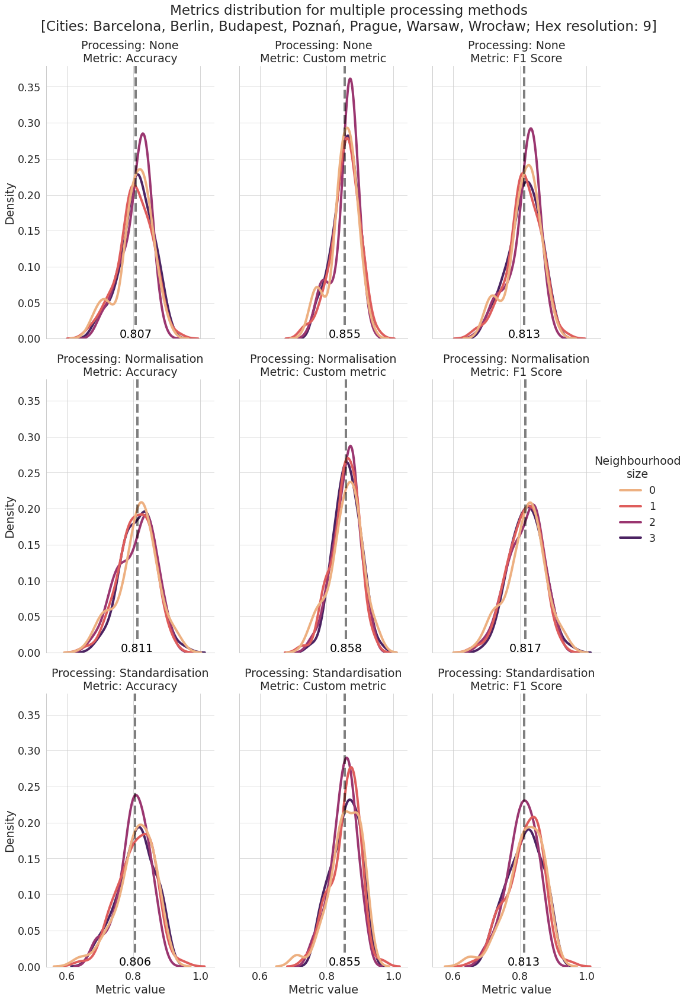

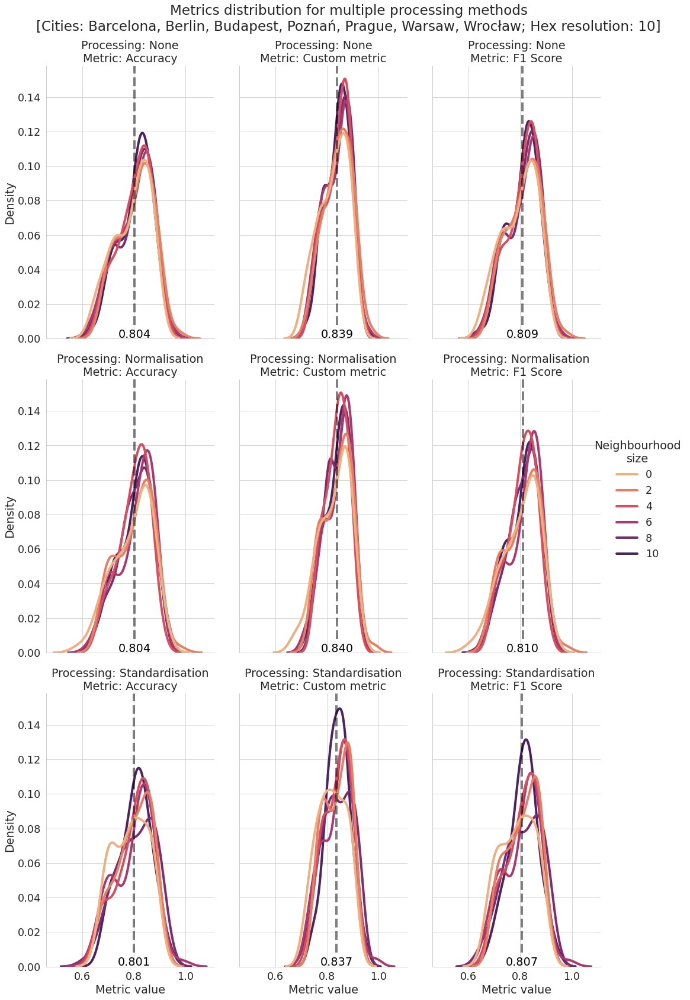

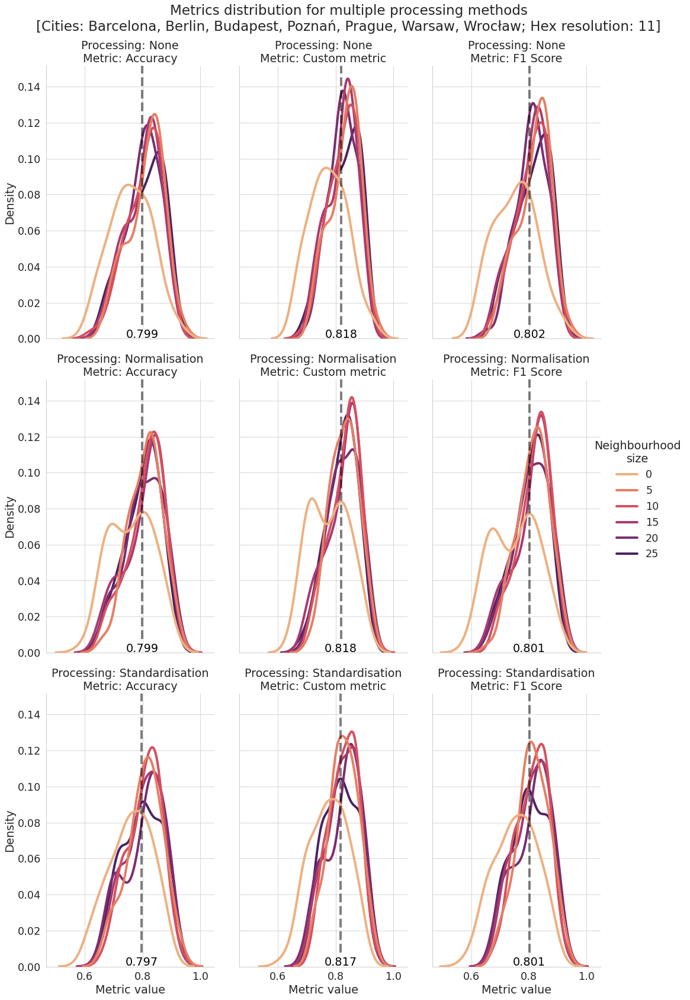

In [14]:
sns.set_context("paper", font_scale=2, rc={"lines.linewidth": 4})
# with sns.plotting_context(font_scale=1.5):
# 'None': 'None',
# 'MinMaxScaler': 'Normalization',
# 'StandardScaler': 'Standardization'
for res in [9, 10, 11]:
# for metric in ['f1_score', 'accuracy', 'custom_metric']:
    filtered_df = df_flat.loc[
        (df_flat.resolution == res) \
        & (df_flat.dataset_type == 'validation') \
        & (df_flat.inbalance_ratio == 1) \
        & (df_flat.classfier_cls == 'RandomForestClassifier') \
        & (df_flat.embedding_cls == 'Count Category') \
        # & (df_flat.neighbours > 0)
    ]
    g = sns.displot(
        data=filtered_df, x="value", 
        hue="neighbours", 
        # markers="embedding_cls",
        # hue="processing", 
        # hue="neighbours",
        row_order=['None', 'Normalisation', 'Standardisation'], 
        row="processing",
        col="metric",
        # col_order=['None', 'Normalization', 'Standardization'],
        
        # facet_kws=dict(row_order=['Concatenate', 'Average', 'Average Diminishing', 'Average Diminishing Squared']),
        kind="kde", height=8, aspect=0.6,
        palette="flare"
    )
    # plt.xlim(0, 1)
    # g.set_axis_labels("Density", f"Metric: {metric}")
    g.map(vertical_mean_line_base, 'value', color='k', ls='--', alpha=0.5)
    g.set_axis_labels("Metric value", "Density")
    g.set_titles("Processing: {row_name}\nMetric: {col_name}")
    g.fig.subplots_adjust(wspace=0.15, hspace=0.15)
    g.fig.subplots_adjust(top=0.92) # adjust the Figure in rp
    g.fig.suptitle(f'Metrics distribution for multiple processing methods\n[Cities: Barcelona, Berlin, Budapest, Poznań, Prague, Warsaw, Wrocław; Hex resolution: {res}]')
    # plt.legend(title='Neighbourhood size')
    g._legend.set_title("Neighbourhood\nsize")
    # g._legend.set_title("Embedding\nmethod")
    g._legend.get_title().set_multialignment('center')
    # plt.tight_layout()
    plt.savefig(f'processing_methods_2_{res}.pdf', dpi=300, format='pdf', bbox_inches='tight')